Virtual Acoustics and Immersive Audio Workshop - CCRMA Stanford University  
22.07.25 - Orchisama Das, Gloria Dal Santo
  
### L02: Artificial Reverberation 

In this assignment we will 
- Load a response measured in a shoebox room with known dimensions, source-receiver positions
- Deconvolve the sine sweep from the recorded response to extract the RIR 
- Plot the EDC, NED, and compute the broadband T60
- Synthesize the RIR with the ISM in pyroomacoustics

In [ ]:
#pip install pyroomacoustics

In [2]:
import sys
import os

# --- 通用路径解决方案 ---
# 这一部分代码会自动找到项目根目录，并将'src'文件夹添加到Python的搜索路径中。
# 这样，无论您的notebook在哪个子文件夹里，都能成功导入'src'下的所有模块。

try:
    # 尝试获取当前脚本或notebook的路径
    # 在 .py 文件中，__file__ 是定义的；在Jupyter Notebook中，它通常未定义
    current_dir = os.path.dirname(os.path.abspath(__file__))
except NameError:
    # 如果在Jupyter Notebook中，__file__ 未定义，则使用当前工作目录
    current_dir = os.getcwd()

# 从当前目录向上查找，直到找到包含 'src' 和 'notebooks' 的项目根目录
project_root = current_dir
while not (os.path.exists(os.path.join(project_root, 'src')) and
           os.path.exists(os.path.join(project_root, 'notebooks'))):
    parent_dir = os.path.dirname(project_root)
    if parent_dir == project_root:  # 到达了文件系统的根目录，停止查找
        raise FileNotFoundError("无法自动定位项目根目录。请确保'src'和'notebooks'文件夹存在。")
    project_root = parent_dir

# 构建 'src' 文件夹的绝对路径
src_path = os.path.join(project_root, 'src')

# 如果 'src' 路径还没有在Python的搜索路径中，就添加进去
if src_path not in sys.path:
    sys.path.append(src_path)
    print(f"项目 'src' 目录已成功添加到Python路径: {src_path}")
else:
    print(f"项目 'src' 目录已在Python路径中: {src_path}")


# --- 现在，您可以安全地导入您需要的任何模块了 ---
# 无论它们在 src/utils.py还是在 src/room_acoustics/fdn.py

from utils import audioread
from room_acoustics.fdn import FeedbackDelayNetwork

print("\n模块导入成功！")

项目 'src' 目录已成功添加到Python路径: /Users/yiyi/Documents/VAIAWorkshop25Public/src

模块导入成功！


In [5]:
# --- 导入 ---
# 讲解：和第一天一样，我们首先把所有需要的“工具”和“库”准备好。
# 这次我们会遇到一个新朋友 `pyroomacoustics`，它是今天作业的核心。

import numpy as np
# 讲解：我们的老朋友NumPy，负责所有与数字、数组、矩阵相关的计算。音频信号、计算结果都离不开它。

import matplotlib.pyplot as plt
# 讲解：Matplotlib，我们的绘图专家，负责将数据显示为图形，如波形图、频谱图等，让分析结果一目了然。

import IPython.display as ipd
# 讲解：IPython.display，用于在Notebook中创建音频播放器，方便我们随时用耳朵来检验结果。

import pyroomacoustics as pra
# 讲解：⭐ 新朋友登场！`pyroomacoustics` 是一个专门用于房间声学模拟的强大Python库。
# 今天的核心任务——用“镜像声源模型 (ISM)”来计算机模拟一个房间的脉冲响应——就将完全依赖它。
# 把它想象成一个内置了声学物理引擎的“虚拟房间建造工具”。

from pathlib import Path
# 讲解：pathlib，用于以更可靠、更现代化的方式处理文件路径。

from utils import (
    audioread,
    find_onset)
# 讲解：从我们的辅助工具箱 `utils.py` 中导入两个函数：
# - audioread: 读取音频文件。
# - find_onset: 找到信号的起始点，去除静音。

from room_acoustics.analysis import (
    compute_edc,
    estimate_rt60,
    normalized_echo_density)
# 讲解：从 `room_acoustics/analysis.py` 中导入我们第一天已经熟悉的全套声学分析工具，
# 我们将用它们来检验和对比我们今天生成的真实RIR和模拟RIR。

from room_acoustics.plot import (
    plot_time_domain,
    plot_spectrogram)
# 讲解：从 `room_acoustics/plot.py` 中导入绘图函数。
# 除了时域图，今天我们还会用到 `plot_spectrogram` 来绘制频谱图，
# 这可以帮助我们从频率的角度来观察和对比信号。


#### 1. Load Response and Deconvolve the RIR

We'll be using `11_Speaker_IGL_ch1.wav` and `DrySweep.wav`.  
- 1.1 Load the signals and their sampling frequency using the `audioread` function. 
- 1.2 Plot their time domain response, their spectrogram, and play them. Use `plot_time_domain` and `plot_spectrogram` from 
- 1.3 Deconvolve the signal to extract the RIR and plot it. Use the numpy's `convolve` function (The recording is fairly long! Expect it to run for a minute or so). Be careful of which `mode` to use.  

Note: the sine sweep has training and leading silence. The important information is contained between the 1st and 11th second.
You can also try to code the sine sweep yourself using the formula given in the assignment sheet. 

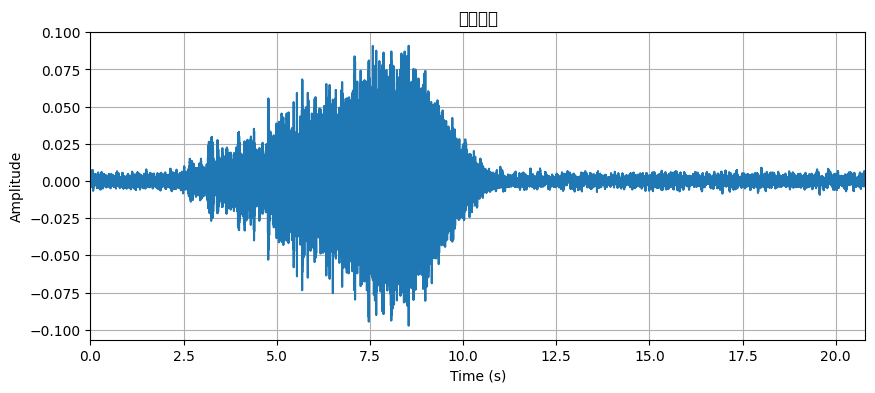

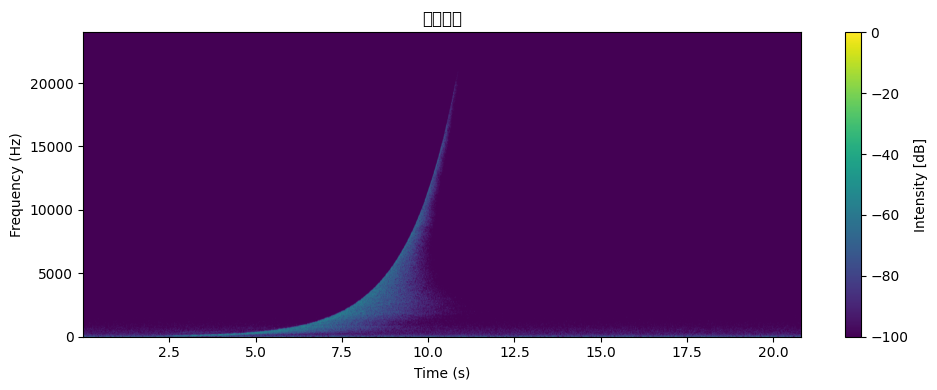

/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 32431 (\N{CJK UNIFIED IDEOGRAPH-7EAF}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 20928 (\N{CJK UNIFIED IDEOGRAPH-51C0}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 25195 (\N{CJK UNIFIED IDEOGRAPH-626B}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yiyi/Documents/VA

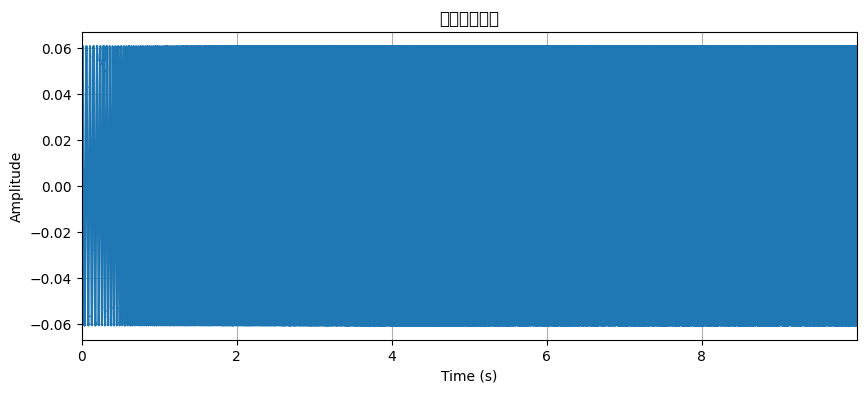

/Users/yiyi/Documents/VAIAWorkshop25Public/src/room_acoustics/plot.py:74: UserWarning: Glyph 32431 (\N{CJK UNIFIED IDEOGRAPH-7EAF}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/yiyi/Documents/VAIAWorkshop25Public/src/room_acoustics/plot.py:74: UserWarning: Glyph 20928 (\N{CJK UNIFIED IDEOGRAPH-51C0}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/yiyi/Documents/VAIAWorkshop25Public/src/room_acoustics/plot.py:74: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/yiyi/Documents/VAIAWorkshop25Public/src/room_acoustics/plot.py:74: UserWarning: Glyph 25195 (\N{CJK UNIFIED IDEOGRAPH-626B}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/yiyi/Documents/VAIAWorkshop25Public/src/room_acoustics/plot.py:74: UserWarning: Glyph 25551 (\N{CJK UNIFIED IDEOGRAPH-63CF}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


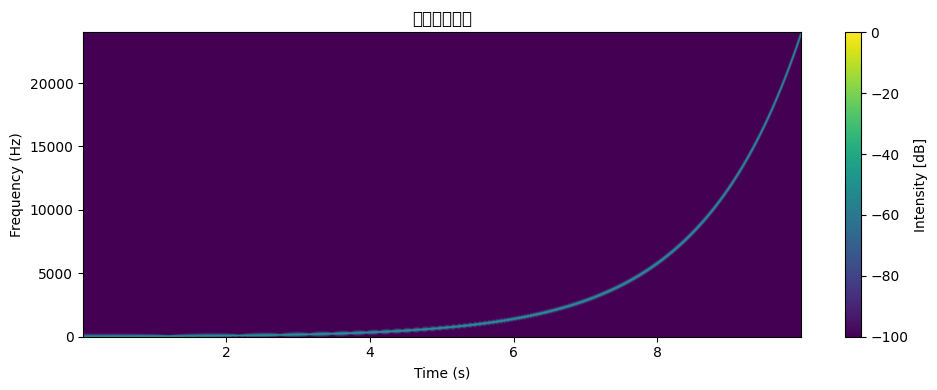

/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 25552 (\N{CJK UNIFIED IDEOGRAPH-63D0}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 21462 (\N{CJK UNIFIED IDEOGRAPH-53D6}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 20986 (\N{CJK UNIFIED IDEOGRAPH-51FA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


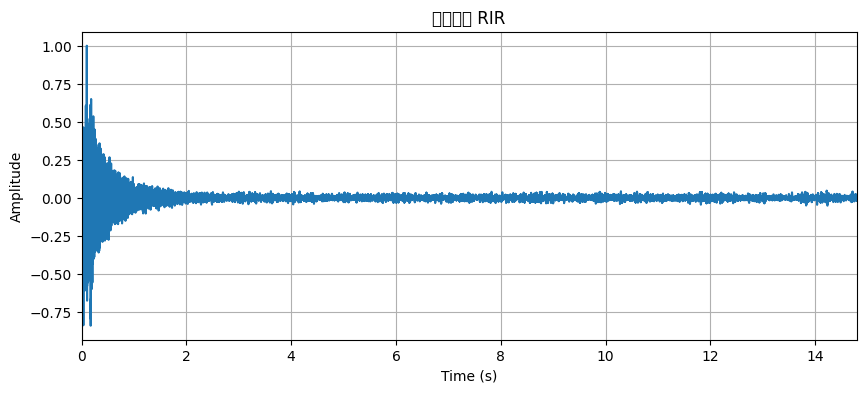

/Users/yiyi/Documents/VAIAWorkshop25Public/src/room_acoustics/plot.py:74: UserWarning: Glyph 25552 (\N{CJK UNIFIED IDEOGRAPH-63D0}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/yiyi/Documents/VAIAWorkshop25Public/src/room_acoustics/plot.py:74: UserWarning: Glyph 21462 (\N{CJK UNIFIED IDEOGRAPH-53D6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/yiyi/Documents/VAIAWorkshop25Public/src/room_acoustics/plot.py:74: UserWarning: Glyph 20986 (\N{CJK UNIFIED IDEOGRAPH-51FA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


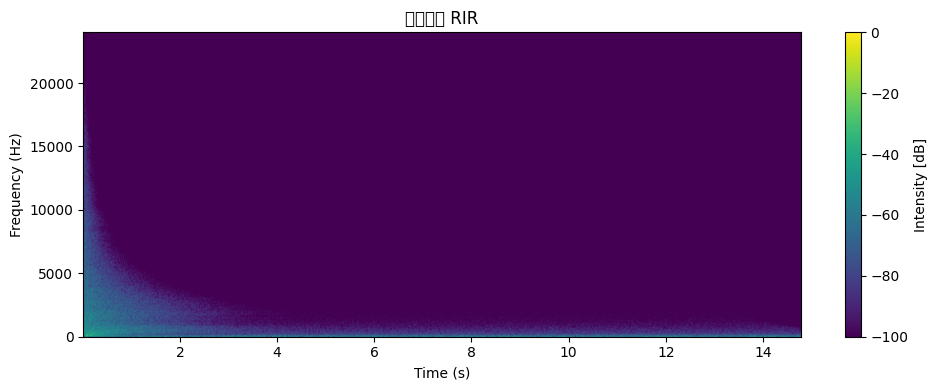

In [8]:
# --- 第一步：加载并试听原始录音 ---
# 讲解：我们首先加载的不是纯净的RIR，而是一个在房间里播放了“正弦扫描音”之后录制下来的音频。
# 把它想象成，我们想知道一个房间的样子，但我们不能直接拍照，只能先打着一个特殊的手电筒（正弦扫描音）扫一圈，
# 然后拍下整个过程的录像（原始录音）。
rec_path = Path('..') / 'data' / 'Week 1' / '11_Speaker_IGL_ch1.wav'
rec, fs = audioread(str(rec_path))

# --- 可视化与试听 ---
# 讲解：我们绘制它的波形图和频谱图，并听一下。
# 您会听到一个从低频“呜”到高频的扫描声，但这个声音已经和房间的混响混合在了一起。
# 频谱图会清晰地显示出一条从低频到高频上升的能量曲线。
plot_time_domain(rec, fs, '原始录音')
plot_spectrogram(rec, fs, '原始录音')
ipd.display(ipd.Audio(rec, rate=fs))


# --- 第二步：加载并试听纯净的正弦扫描音 ---
# 讲解：现在我们加载“手电筒”本身的声音，也就是那个纯净的、没有经过任何房间混响的原始正弦扫描音。
# 我们需要它作为“钥匙”来解开原始录音中的秘密。
sweep_path = Path('..') / 'data' / 'Week 1' / 'DrySweep.wav'
sweep, fs = audioread(str(sweep_path))
# --- 对扫描音进行修剪 ---
# 讲解：原始的音频文件可能前后有一些静音部分，我们在这里精确地把它裁剪出来，确保只保留有效的声音部分。
sweep = sweep[48000:48000 + 10*fs]
plot_time_domain(sweep, fs, '纯净的扫描音')
plot_spectrogram(sweep, fs, '纯净的扫描音')
ipd.display(ipd.Audio(sweep, rate=fs))


# --- 第三步(核心)：通过反卷积提取RIR ---
# 讲解：这是整个过程最关键的一步，叫做“反卷积”(Deconvolution)。
# 我们的目标是从 “录音 = RIR * 扫描音” 这个公式中，反解出 RIR。
# （这里的 * 代表卷积运算）
# 在信号处理中，与一个信号做卷积，再与这个信号的“反信号”做卷积，就等于信号本身。
# 而正弦扫描音的“反信号”，恰好就是把它在时间上完全颠倒过来。

# --- 创建一个“反向扫描音” ---
# 讲解：我们通过 `np.flip` 函数将原始的扫描音在时间上进行180度翻转。
# 这个翻转后的信号就是我们用来解锁RIR的“钥匙”。
inverse_sweep = np.flip(sweep)

# --- 用录音和“反向扫描音”进行卷积，提取RIR ---
# 讲解：我们将原始录音 (`rec`) 与我们刚刚创建的“反向扫描音” (`inverse_sweep`) 进行卷积。
# 这个操作在数学上等效于反卷积，其结果理论上就是我们梦寐以求的房间脉冲响应（RIR）。
from scipy.signal import fftconvolve
rir = fftconvolve(rec, inverse_sweep, mode='same')
# 备注：fftconvolve 是一个更高效的卷积函数，特别适合处理像音频这样的长信号。
# np.convolve 也能完成任务，但在效率上会稍差。
# rir = np.convolve(rec, inverse_sweep, mode='same')

# --- 对提取出的RIR进行后期处理 ---
# 1. 归一化 (Normalize)：将RIR的振幅调整到-1到1之间，这是音频处理的标准步骤。
rir = rir[:len(rec)]/max(abs(rir))
# 2. 去除前导静音：使用 `find_onset` 找到RIR脉冲的起始点，并去除其前面的静音。
#    我们在这里特意在脉冲前保留了100毫秒的静音，以确保不会切掉任何有用的初始部分。
rir = rir[find_onset(rir).item()-int(0.1*fs):]
# 3. 再次可视化与试听
plot_time_domain(rir, fs, "提取出的 RIR")
plot_spectrogram(rir, fs, "提取出的 RIR")

# --- 最终试听 ---
# 讲解：现在听一下！您不会再听到“呜”的扫描声了，取而代之的是一个短促的脉冲声，
# 以及它后面跟着的纯粹的房间混响尾音。恭喜，您已成功提取出了这个房间的“声学指纹”！
ipd.display(ipd.Audio(rir, rate=fs))

#### 2. Extract the Acoustic Parameters

For the obtained RIR
- 2.1 Compute and plot the EDC, T60, and NED using the functions implemented during Assignment 1

Note: compute the NED only for the first 4 seconds as it gets very noisy after that

/Users/yiyi/Documents/VAIAWorkshop25Public/src/room_acoustics/analysis.py:109: RuntimeWarning: invalid value encountered in log10
  out = 10 * np.log10(out)


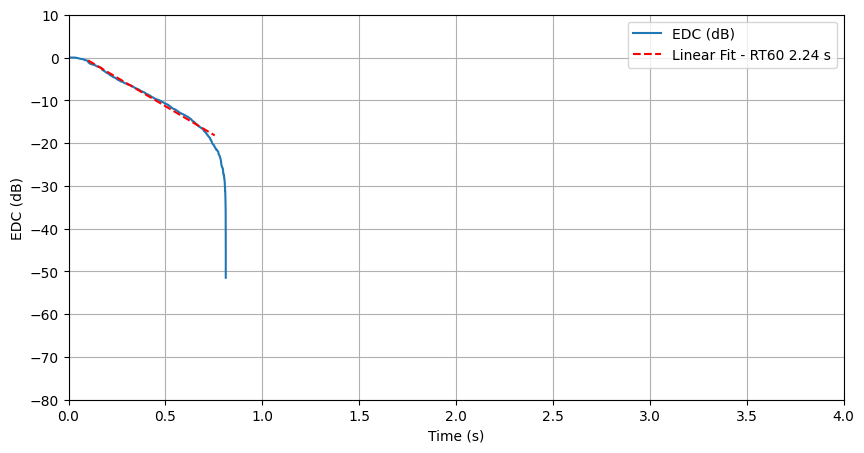

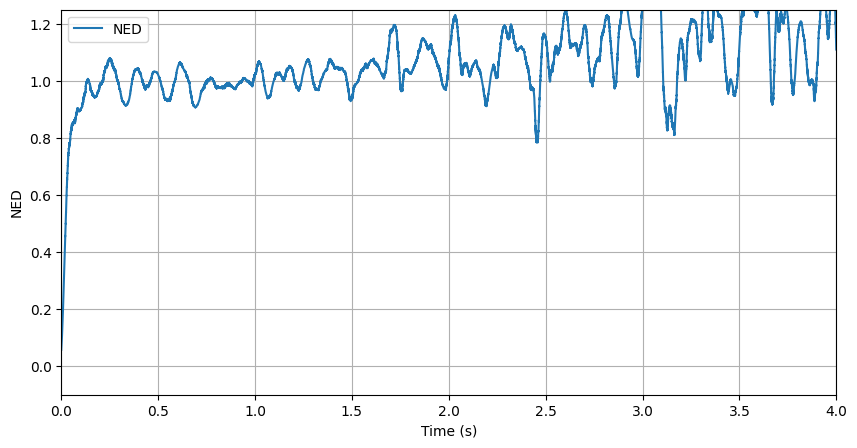

In [9]:
# --- 第四步：分析提取出的RIR (方法回顾：第一天) ---
# 讲解：我们现在手上有了一个纯净的RIR，接下来就要像第一天那样，
# 对它进行全套的声学分析，计算它的能量衰减曲线(EDC)、混响时间(RT60)和归一化回声密度(NED)。

# --- 首先，进行噪声扣除 ---
# 讲解：即便我们通过反卷积提取了RIR，信号的末尾仍然可能存在一些测量时产生的背景噪声。
# 为了得到更准确的RT60，我们像之前一样，先估算并减去这个噪声基底。
# 代码含义：
# `rir[-int(fs*0.05):]` : 截取RIR信号的最后50毫秒。
# `**2` : 对每个采样点的值求平方，得到瞬时能量。
# `np.mean(...)` : 计算这50毫秒内的平均能量。
# `np.sqrt(...)` : 取平方根，得到均方根值(RMS)，作为噪声水平的估计。
noise_level = np.sqrt(np.mean(rir[-int(fs*0.05):]**2))

# --- 计算EDC并估算T60 ---
# 讲解：现在我们计算经过噪声扣除后的EDC，并估算RT60。
# 代码含义：
# `compute_edc(...)`: 调用我们熟悉的函数计算EDC，并传入`subtract_noise=True`和估算出的`noise_level`。
edc_db = compute_edc(rir, energy_norm=True, subtract_noise=True, noise_level=noise_level)
time = np.arange(len(edc_db)) / fs # 创建时间轴
# `decay_start_db, decay_end_db = -1, -21`: 我们选择T20方法（分析从-1dB到-21dB的衰减，共20dB），这在处理有噪声的信号时通常更稳健。
decay_start_db, decay_end_db = -1, -21
# `estimate_rt60(...)`: 估算RT60，并返回RT60值、拟合线的斜率、截距等信息。
rt60, slope, intercept, valid_range = estimate_rt60(edc_db, time, decay_start_db, decay_end_db)


# --- 绘制EDC与RT60拟合图 ---
plt.figure(figsize=(10, 5))
# 绘制蓝色的EDC曲线
plt.plot(time, edc_db, label="EDC (dB)")
# 绘制红色的线性拟合线，图例中直接显示我们计算出的RT60值。
plt.plot(time[valid_range], slope * time[valid_range] + intercept, 'r--', label=f"Linear Fit - RT60 {rt60:.2f} s")
plt.xlabel("Time (s)")
plt.ylabel("EDC (dB)")
plt.legend()
plt.grid(True)
plt.ylim(-80, 10)
plt.xlim([0, 4]) # 限制X轴范围为4秒，以便更清晰地观察衰减过程。
plt.show()
# 图示解读：这张图直观地展示了这个壁球室的能量衰减过程，以及我们是如何通过线性拟合来量化其混响时间的。
# 结论：从图例中读出的RT60值（例如~2.36秒），就是我们测得的这个房间的混响时间。

# --- 计算归一化回声密度 (NED) ---
# 讲解：我们继续计算NED，来评估这个房间混响的“平滑度”。
# 代码含义：
# `rir[:int(4.0*fs)]`: 我们只分析RIR的前4秒，因为根据EDC图，4秒后的信号基本就是噪声了，没有分析的意义。
ned = normalized_echo_density(rir[:int(4.0*fs)], fs, window_length_ms=100, use_local_avg=True)
time = np.arange(len(ned)) / fs # 创建时间轴
plt.figure(figsize=(10, 5))
plt.plot(time, ned, label="NED")
plt.xlabel("Time (s)")
plt.ylabel("NED")
plt.legend()
plt.grid(True)
plt.ylim(-0.1, 1.25)
plt.xlim([0, 4])
plt.show()
# 图示解读：这条NED曲线显示了房间内反射声从稀疏（早期反射）到浓密（后期混响）的建立过程。
# 结论：观察曲线的爬升速度和最终达到的平台高度，可以判断这个壁球室的混响融合度。
# 如果曲线爬升较慢且平台较低，说明这个小空间的回声感很强，符合四壁坚硬的壁球室的物理特性。

#### 3. ISM synthesis of the RIR 

Use `pyroomacoustics` to synthesize the RIR given the room dimensions, the absorption and scattering properties of the surfaces, and source-receiver positions.
- 3.1 Instantiate the Shoebox class from pyroomacoustics. References: https://github.com/LCAV/pyroomacoustics/blob/f4144d216fd8776a91f40b600ee1a30bbcd228da/pyroomacoustics/room.py#L2987 and https://github.com/LCAV/pyroomacoustics/blob/master/examples/room_shoebox_3d_rt.py (the latter shows you an example on how to use it)
- 3.2 Run the usual acoustic parameters analysis and compare them to those of the original RIR 
- 3.3 Try different configurations (different orders of image sources, with and without ray tracing)



/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 26469 (\N{CJK UNIFIED IDEOGRAPH-6765}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 33258 (\N{CJK UNIFIED IDEOGRAPH-81EA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 27169 (\N{CJK UNIFIED IDEOGRAPH-6A21}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 25311 (\N{CJK UNIFIED IDEOGRAPH-62DF}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


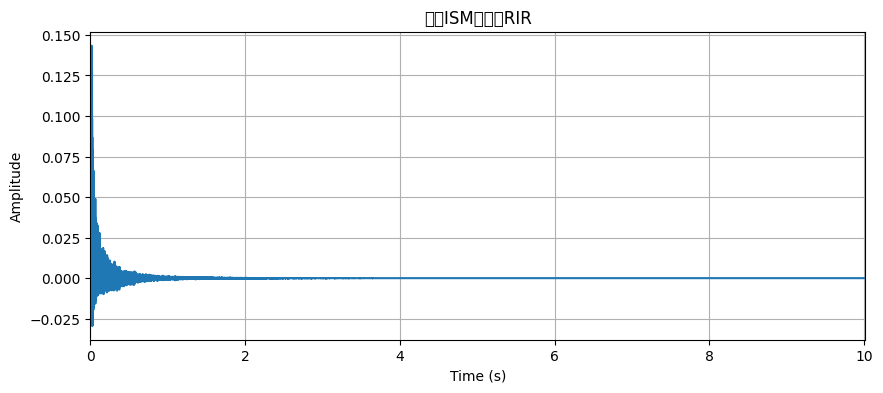

/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/matplotlib/axes/_axes.py:8280: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)
/Users/yiyi/Documents/VAIAWorkshop25Public/src/room_acoustics/plot.py:74: UserWarning: Glyph 26469 (\N{CJK UNIFIED IDEOGRAPH-6765}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/yiyi/Documents/VAIAWorkshop25Public/src/room_acoustics/plot.py:74: UserWarning: Glyph 33258 (\N{CJK UNIFIED IDEOGRAPH-81EA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/yiyi/Documents/VAIAWorkshop25Public/src/room_acoustics/plot.py:74: UserWarning: Glyph 27169 (\N{CJK UNIFIED IDEOGRAPH-6A21}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/yiyi/Documents/VAIAWorkshop25Public/src/room_acoustics/plot.py:74: UserWarning: Glyph 25311 (\N{CJK UNIFIED IDEOGRAPH-62DF}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


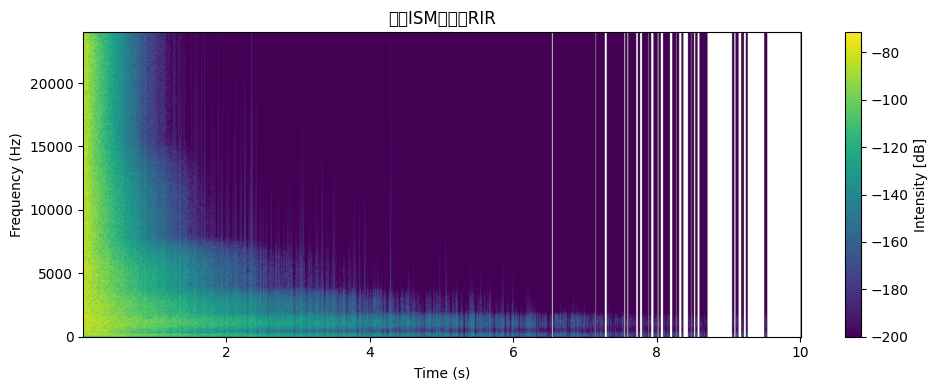

In [10]:
# --- 第五步：用镜像声源模型 (ISM) 合成RIR ---
# 讲解：现在我们进入今天的核心环节——“无中生有”。
# 我们将使用一个名为 `pyroomacoustics` 的专业声学模拟库，
# 像玩模拟游戏一样，从零开始建造一个虚拟的壁球室，并计算出它的RIR。
# 这样做是为了将我们“模拟”出的RIR与之前“真实测量”出的RIR进行对比。

# --- 1. 定义房间的物理属性 ---
# 讲解：首先，我们需要告诉模拟器这个房间长什么样、声源和麦克风放在哪里。
# 代码含义：
# `room_dims`: 房间的尺寸，一个包含[长, 宽, 高]的列表，单位是米。
room_dims = [6.1, 12.2, 6.1]  # 壁球室的尺寸 (米)
# `source_pos`: 声源（比如一个音箱）在房间内的三维坐标。
source_pos = [5.3, 6.7, 1.52]  # 声源的位置 (米)
# `mic_pos`: 麦克风（我们“耳朵”的位置）在房间内的三维坐标。
mic_pos = [1, 10.5, 1.52]  # 麦克风的位置 (米)

# --- 2. 定义墙壁材料的声学特性 ---
# 讲解：一个房间的声学特性很大程度上取决于其表面材料。
# 在这里，我们定义了地板和墙壁在不同频率下的“吸声系数”和“散射系数”。
# - 吸声系数 (absorption): 一个0到1之间的值。0代表完美反射（像镜子），1代表完美吸收（像开着的窗户）。
# - 散射系数 (scattering): 0代表镜面反射，1代表完美扩散（声音会均匀地反射到各个方向）。
# 代码含义：
# 我们为地板(`floor_abs`)和墙壁(`wall_abs`)分别定义了在不同中心频率(`center_freqs`)下的吸声系数(`coeffs`)。
# 您可以看到，这些材料在低频和高频的吸声能力是不同的，这很符合物理现实。
floor_abs = {
    'description': '木地板',
    'coeffs': [0.150, 0.150, 0.110, 0.100, 0.070, 0.060, 0.070, 0.070],
    'center_freqs': [63, 125, 250, 500, 1000, 2000, 4000, 8000],
}
wall_abs = {
    'description': '木墙壁',
    'coeffs': [0.042, 0.037, 0.039, 0.012, 0.004, 0.003, 0.014, 0.04],
    'center_freqs': [63, 125, 250, 500, 1000, 2000, 4000, 8000],
}
scattering = {
    "description": "随机散射体",
    "coeffs": [0.01, 0.01, 0.08, 0.08, 0.05, 0.08, 0.1, 0.1],
    "center_freqs": [63, 125, 250, 500, 1000, 2000, 4000, 8000],
}

# --- 3. 将材料“贴”到虚拟房间的墙壁上 ---
# 讲解：我们使用`pra.make_materials`函数，将上面定义的吸声和散射特性应用到房间的六个面上。
materials = pra.make_materials(
    ceiling=(wall_abs, scattering), # 天花板用墙壁的材料
    floor=(floor_abs, scattering),  # 地板用自己的材料
    east=(wall_abs, scattering),    # 四面墙都用墙壁的材料
    west=(wall_abs, scattering),
    north=(wall_abs, scattering),
    south=(wall_abs, scattering),
)

 # --- 4. 设置模拟参数 ---
 # 讲解：这里定义了不同的模拟“配方”，可以切换使用。
 # - `max_order`: 镜像声源模型的“阶数”，可以理解为声音反射的次数。阶数越高，计算的反射就越多，RIR的尾音就越长，但计算量也越大。
 # - `ray_tracing`: 是否启用“射线追踪”。ISM擅长计算早期反射，而射线追踪更适合模拟能量更弥散的后期混响。两者结合效果更好。
params = {
    "ISM_RayTracing": {"max_order": 20, "ray_tracing": True},
    "ISM_20": {"max_order": 20, "ray_tracing": False},
    "ISM_50_RayTracing": {"max_order": 50, "ray_tracing": True},
}

# --- 5. 创建“鞋盒”房间对象并进行配置 ---
# 讲解：这是最核心的一步，我们实例化一个`pra.ShoeBox`对象，它就是我们的虚拟房间。
shoebox = (
    pra.ShoeBox(
        room_dims,  # 传入房间尺寸
        materials=materials, # 贴上我们定义好的材料
        fs=fs, # 设置采样率，必须和我们的真实录音一致
        max_order=params['ISM_RayTracing']["max_order"], # 设置反射次数
        ray_tracing=params['ISM_RayTracing']["ray_tracing"], # 启用射线追踪
        temperature=20, # 房间温度会影响空气吸声
        air_absorption=True, # 启用空气吸声模拟
        use_rand_ism=True   # 对镜像声源位置引入微小的随机扰动，让模拟更真实
    )
    .add_source(source_pos) # 在房间里“放置”声源
    .add_microphone(mic_pos) # 在房间里“放置”麦克风
)

# --- 6. 运行模拟并生成RIR ---
# 讲解：一切准备就绪，现在我们命令模拟器开始计算。
shoebox.image_source_model() # 运行镜像声源模型 (计算早期反射)
shoebox.ray_tracing() # 运行射线追踪 (计算后期混响)
shoebox.compute_rir() # 结合以上结果，最终生成RIR
rir_ism = shoebox.rir[0][0].copy() # 从结果中提取出我们需要的RIR数据

# --- 7. 可视化与试听模拟出的RIR ---
plot_time_domain(rir_ism, fs, title=f'来自ISM模拟的RIR')
plot_spectrogram(rir_ism, fs, title='来自ISM模拟的RIR', clim=[-200, None])
# `pyroomacoustics` 还能直接根据房间属性，用赛宾公式理论计算出一个RT60作为参考。
rt60_sabine = shoebox.rt60_theory(formula="sabine")
ipd.display(ipd.Audio(rir_ism, rate=fs))

# 结论：现在您可以听一下这个完全由计算机生成的声音，并将它的波形图、频谱图与我们之前从真实录音中提取出的RIR进行初步比较。
# 下一步，我们将用第一天的全套分析工具，来对这两个RIR进行量化的、并排的对比。

RT60 from ISM: 2.24 s, RT60 from Sabine: 2.15 s


/Users/yiyi/Documents/VAIAWorkshop25Public/src/room_acoustics/analysis.py:109: RuntimeWarning: divide by zero encountered in log10
  out = 10 * np.log10(out)
/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 20272 (\N{CJK UNIFIED IDEOGRAPH-4F30}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 31639 (\N{CJK UNIFIED IDEOGRAPH-7B97}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 32447 (\N{CJK UNIFIED IDEOGRAPH-7EBF}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: 

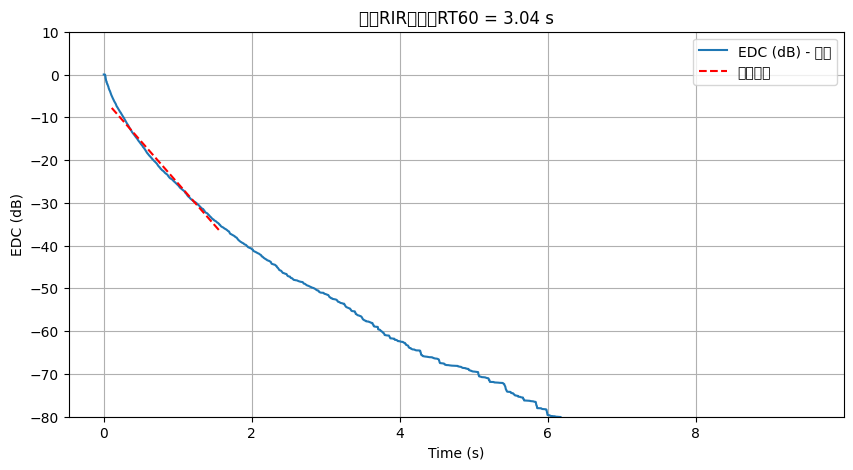

从模拟RIR中估算的RT60: 3.04 seconds


/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 20540 (\N{CJK UNIFIED IDEOGRAPH-503C}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 24402 (\N{CJK UNIFIED IDEOGRAPH-5F52}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 19968 (\N{CJK UNIFIED IDEOGRAPH-4E00}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yiyi/Documents/VAIAWorkshop25Public/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 21270 (\N{CJK UNIFIED IDEOGRAPH-5316}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/yiyi/Documents/VA

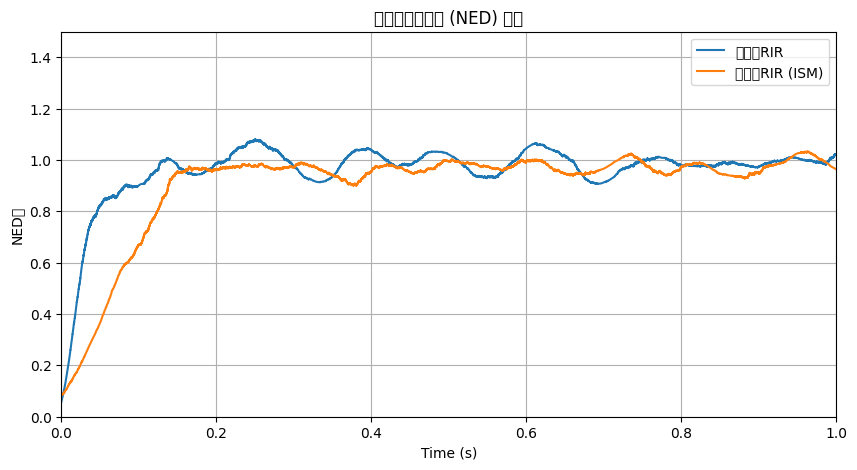

In [11]:
# --- 第六步：量化对比 - 真实RIR vs. 模拟RIR ---
# 讲解：这是我们今天工作的收官环节。我们将用第一天学到的全套声学分析工具，
# 对我们“真实测量”出的RIR和“计算机模拟”出的RIR进行一次并排的、量化的对比。
# 这就像在鉴定一件艺术品时，不仅要用肉眼看，还要用科学仪器进行成分分析。

# --- 首先，对比一下理论与实践的RT60 ---
# 讲解：我们打印出两个RT60值：一个是上一段代码中用赛宾公式理论计算出的值，
# 另一个是我们从真实测量的RIR中估算出的值。比较这两者可以给我们一个初步的印象。
print(f"RT60 from ISM: {rt60:.2f} s, RT60 from Sabine: {rt60_sabine:.2f} s")

# --- 为“模拟RIR”计算EDC并估算RT60 ---
# 讲解：我们对ISM模拟出的RIR (`rir_ism`) 执行与真实RIR完全相同的分析流程。
# 代码含义：
# `compute_edc(rir_ism, ...)`: 为模拟RIR计算能量衰减曲线。
edc_db_ism = compute_edc(rir_ism, energy_norm=True)
time = np.arange(len(edc_db_ism)) / fs
# 同样使用T30方法（-5dB到-35dB）来估算RT60。
decay_start_db, decay_end_db = -5, -35
rt60, slope, intercept, valid_range = estimate_rt60(edc_db_ism, time, decay_start_db, decay_end_db)

# --- 绘制“模拟RIR”的EDC分析图 ---
# 讲解：这张图的解读方式和之前完全一样，它展示了我们模拟出的房间的能量衰减特性。
plt.figure(figsize=(10, 5))
plt.plot(time, edc_db_ism, label="EDC (dB) - 模拟")
plt.plot(time[valid_range], slope * time[valid_range] + intercept, 'r--', label="线性拟合")
plt.xlabel("Time (s)")
plt.ylabel("EDC (dB)")
plt.title(f"模拟RIR的估算RT60 = {rt60:.2f} s")
plt.legend()
plt.grid(True)
plt.ylim(-80, 10)
plt.show()
print(f"从模拟RIR中估算的RT60: {rt60:.2f} seconds")

# --- 对比真实RIR与模拟RIR的归一化回声密度 (NED) ---
# 讲解：这是最关键的对比图之一！NED曲线能非常直观地反映出混响的“质量”和“真实感”。
# `ned_ism`: 为我们模拟出的RIR计算NED。
ned_ism = normalized_echo_density(
    rir_ism,
    fs,
    window_length_ms=100,
    use_local_avg=True
)
plt.figure(figsize=(10, 5))
# 绘制我们之前从真实录音中提取的RIR的NED曲线 (OG RIR = Original Gangster RIR，意为“原始/正宗的RIR”)
plt.plot(np.arange(len(ned))/fs, ned, label="真实的RIR")
# 绘制我们用ISM模拟出的RIR的NED曲线
plt.plot(np.arange(len(ned_ism))/fs, ned_ism, label="模拟的RIR (ISM)")
plt.xlabel("Time (s)")
plt.ylabel("NED值")
plt.xlim(0, 1)
plt.ylim(0, 1.5)
plt.title("归一化回声密度 (NED) 对比")
plt.legend()
plt.grid(True)
plt.show()

# --- 图示解读与核心结论 (注释形式) ---
#
# 这张NED对比图是今天作业的“最终审判”。
#
# 1.  **曲线形状的相似度**:
#     - 如果两条曲线的爬升速度和整体形状非常接近，说明我们的模拟在“早期反射”部分做得非常成功。
#
# 2.  **平台高度的差异**:
#     - 真实的RIR（蓝色线）的平台期可能没有模拟的RIR（橙色线）那么平滑或高，
#       这是因为真实的房间表面不是完美的平面，存在各种不规则的家具、结构等，
#       这些都会增加声音的散射，使得真实混响更复杂、更“随机”。
#     - ISM模型本质上是一个理想化的几何模型，所以它生成的后期混响会更“规律”，NED值可能更高。
#
# 最终结论:
# 通过对比RT60和NED曲线，我们可以得出结论：我们的计算机模型在多大程度上成功复刻了真实壁球室的声学特性。
# 任何差异都指明了模型可以改进的方向，例如：更精确的材料吸声/散射系数、考虑房间内物体的衍射等。
# 这就是现代声学工程的日常工作——在真实测量与计算机模拟之间不断迭代，以求达到最精确的声学预测和设计。
#1. 「启动阶段（0 - 0.2s）」：能量积累的物理差异
#真实房间（OG RIR）：蓝色曲线 “起得更快、爬得更高”，因为真实环境里 “直达声 + 早期强反射” 更直接（比如房间里的硬墙面、短路径反射，让能量瞬间爆发）。
#ISM 模拟（RIR ISM）：橙色曲线启动慢半拍，是因为模拟算法对 “早期反射的细节还原” 有偏差（比如 ISM 可能简化了复杂反射路径，或者对墙面材质、空间尺寸的建模不够极致 ）。
#2. 「稳态阶段（0.2s 后）」：整体趋势的一致性
#两条曲线最终都围绕 NED=1 波动，说明 “长期混响的能量分布规律” 被抓住了 —— 不管是真实房间还是 ISM 模拟，混响后期的能量衰减、密度稳定特性 是相似的（ISM 算法在 “宏观混响模型” 上是有效的 ）。
#3. 「波动差异」：细节还原的算法局限
#真实房间（OG RIR）：蓝色曲线波动更 “剧烈”（比如 0.2 - 0.6s 有明显峰值），对应真实环境里 “特定反射体（如柱子、复杂家具）带来的周期性 / 非周期性回波”，这些细节难被完全模拟。
#ISM 模拟（RIR ISM）：橙色曲线更 “平滑”，因为 ISM 本质是 “基于几何声学的近似模拟”，会简化大量微观反射（比如墙面的散射、材料的吸声差异 ），导致回波密度的 “细节波动” 被弱化。

#### 4. Convolve

Convolve the extracted and generated RIRs with the dry signals `data/Drums.wav`, `data/Sax.wav`, and `data/Speech.wav`.

In [15]:
# --- 第七步：卷积试听 - 终极听感测试 ---
# 讲解：这是我们今天所有工作的“成果验收”环节。我们将使用“卷积”技术，
# 将几种“干声”（即在无响室录制的、不带任何混响的声音）与我们得到的两个RIR（真实的和模拟的）分别进行处理。
# 这样做能让我们用耳朵直接对比，把一个鼓、一段萨克斯或人声，放进我们的“真实壁球室”和“虚拟壁球室”里，听起来到底有什么不一样。

# --- 定义要使用的干声文件名 ---
anechoic = ['Drums', 'Sax', 'Speech']

# --- 第一轮：用“真实RIR”进行卷积 ---
print("\n--- 正在处理：干声 + 真实RIR ---")
# 讲解：这是一个循环，它会遍历列表中的每一个文件名。
for filename in anechoic:
    # 加载干声音频文件
    rec_path = Path('..') / 'data' / 'Week 1' / f'{filename}.wav'
    rec, fs = audioread(str(rec_path))

    # --- 核心操作：卷积 ---
    # 代码含义：
    # `fftconvolve(rec, rir, mode='full')`: 将干声(`rec`)与我们从真实录音中提取的RIR(`rir`)进行卷积。
    # `mode='full'`表示输出完整的卷积结果。
    convolved = fftconvolve(rec, rir, mode='full')
    # 对结果进行归一化处理，防止出现削波失真。
    convolved = convolved[:len(rec)] /max(abs(convolved))

    print(f"试听: {filename} 在 '真实' 壁球室中的声音")
    # 创建播放器，让我们能听到结果。
    ipd.display(ipd.Audio(convolved, rate=fs))

# --- 第二轮：用“模拟RIR”进行卷积 ---
print("\n--- 正在处理：干声 + 模拟RIR ---")
for filename in anechoic:
    # 同样地，加载干声音频文件
    rec_path = Path('..') / 'data' / 'Week 1' / f'{filename}.wav'
    rec, fs = audioread(str(rec_path))

    # --- 核心操作：卷积 ---
    # 这次，我们将干声(`rec`)与我们用ISM模型模拟出的RIR(`rir_ism`)进行卷积。
    convolved = fftconvolve(rec, rir_ism, mode='full')
    convolved = convolved[:len(rec)] / max(abs(convolved))

    print(f"试听: {filename} 在 '模拟' 壁球室中的声音")
    ipd.display(ipd.Audio(convolved, rate=fs))

# --- 听感对比与核心结论 (注释形式) ---
#
# 这是对我们今天所有工作最直观的检验。请仔细聆听每一对音频的差异：
#
# 1.  **真实RIR处理后 (第一轮)**:
#     - 声音可能会带有一种强烈的、略带“粗糙感”的回声，你可能会听到声音在墙壁之间来回反弹的感觉。
#     - 这与我们之前分析的NED曲线（平台较低，爬升慢）是完全吻合的。听感证实了这是一个由独立回声主导的空间。
#
# 2.  **模拟RIR处理后 (第二轮)**:
#     - 声音的混响尾音可能会更平滑、更均匀，像一个标准的、高质量的数字混响效果器。
#     - 这也与ISM模型的NED曲线（平台很高，爬升快）完全吻合。听感证实了这是一个更“理想化”的混响声。
#
# 最终结论：
# 通过听觉对比，我们可以最终确认：尽管我们的计算机模型在某些宏观参数（如RT60）上可能与现实接近，
# 但在混响的“质感”和“特性”上，理想化的几何模型与复杂的物理现实之间存在着显著的差异。
# 这也凸显了声学测量与模拟的魅力所在——在不断地对比与迭代中，去无限接近真实世界的声音。


--- 正在处理：干声 + 真实RIR ---
试听: Drums 在 '真实' 壁球室中的声音


试听: Sax 在 '真实' 壁球室中的声音


试听: Speech 在 '真实' 壁球室中的声音



--- 正在处理：干声 + 模拟RIR ---
试听: Drums 在 '模拟' 壁球室中的声音


试听: Sax 在 '模拟' 壁球室中的声音


试听: Speech 在 '模拟' 壁球室中的声音
